 Если достаточно часто с одинаковой периодичностью открывать какой-то сайт, то ему это не понравится и он вас забанит. Хорошо, если это будет просто капча, сквозь которую еще можно пройти. Авито, например, не прощает ошибок и спустя пару предупреждений банит ip адрес на неделю. 

In [25]:
### Если просто запустить этот код, который по сути одходит всего одну страницу, авито уже заставит проходить капчу
from bs4 import BeautifulSoup
from urllib.request import urlopen

houses = []
html = urlopen("https://www.avito.ru/moskva/kvartiry/sdam/posutochno/-ASgBAgICAkSSA8gQ8AeSUg?p=1")
html_soup = BeautifulSoup(html, "html.parser")
house_data = html_soup.find('div', class_='items-items-38oUm').findAll('div', class_='iva-item-root-G3n7v photo-slider-slider-3tEix iva-item-list-2_PpT iva-item-redesign-1OBTh items-item-1Hoqq items-listItem-11orH js-catalog-item-enum')
houses.extend(house_data)

n = int(len(houses)) - 1
count = 0
while count <= n:
    info = houses[int(count)]
    link = info.find('a', class_='link-link-39EVK link-design-default-2sPEv title-root-395AQ iva-item-title-1Rmmj title-listRedesign-3RaU2 title-root_maxHeight-3obWc')
    link = link.get('href')
    link = 'https://www.avito.ru/' + link
    print(link)
    response = urlopen(link)
    html_soup = BeautifulSoup(response, 'html.parser')
    count += 1

https://www.avito.ru//moskva/kvartiry/1-k._kvartira_39_m416_et._1134344408
https://www.avito.ru//moskva/kvartiry/1-k._kvartira_36m_68et._1494853202
https://www.avito.ru//moskva/kvartiry/1-k._kvartira_30m_528et._1879886596
https://www.avito.ru//moskva/kvartiry/1-k_kvartira_38_m_522_et._1894983378
https://www.avito.ru//moskva/kvartiry/2-k_kvartira_60_m_25_et._75574943
https://www.avito.ru//moskva/kvartiry/2-k._kvartira_50_m55_et._2057066833
https://www.avito.ru//moskva/kvartiry/1-k_kvartira_32_m_38_et._2059943004
https://www.avito.ru//moskva/kvartiry/kvartira-studiya_20_m516_et._2024226238
https://www.avito.ru//moskva/kvartiry/1-k._kvartira_45_m19_et._2004756715
https://www.avito.ru//moskva/kvartiry/1-k_kvartira_42_m_89_et._1550329897
https://www.avito.ru//moskva/kvartiry/2-k._kvartira_42_m114_et._2078552919
https://www.avito.ru//moskva/kvartiry/1-k._kvartira_31_m49_et._2056568221
https://www.avito.ru//moskva/kvartiry/1-k._kvartira_35m_59et._432517895
https://www.avito.ru//moskva/kvartir

HTTPError: HTTP Error 429: Too Many Requests

Обычно эта проблема решается добавлением следующих строк кода после каждого открытия ссылки

In [ ]:
value = random.random()
scaled_value = 1 + (value * (9 - 5))
time.sleep(scaled_value)

Однако в случае авито даже это не помогает!

 P.S. Авито с его множествами ловушек я так и не смог побороть. Как я понял, раз в какое-то время сайт по сути как-то автоматически меняется, изменяя названия и местоположения некоторых классов, при этом внешне ничего не меняется! 

---




Посмотрим на объяление с сайта Яндекс Недвижимость

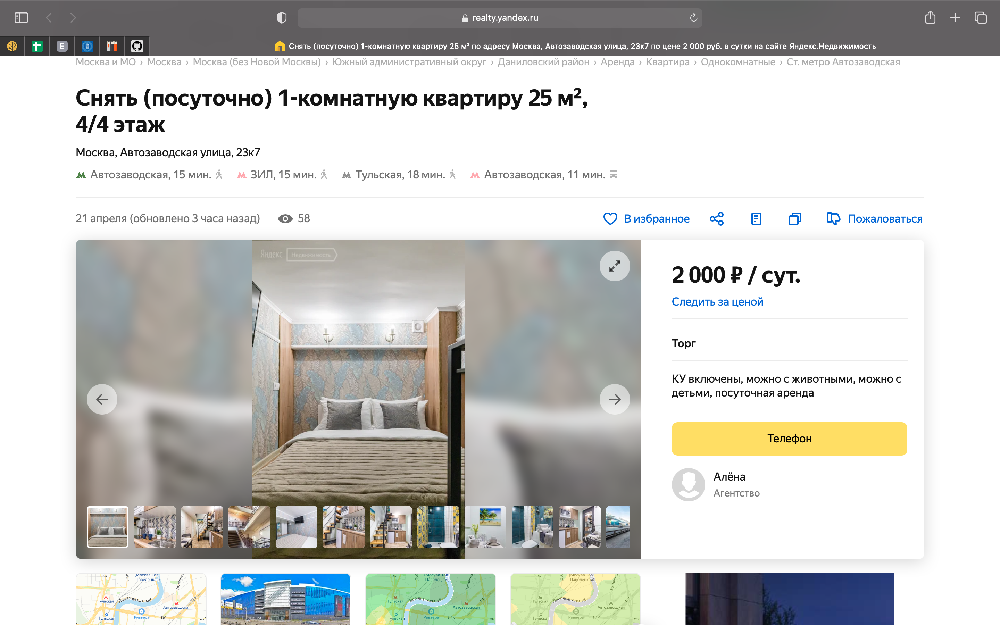

In [14]:
from IPython.display import Image
Image(filename='/Users/slavapirogov/Desktop/Снимок экрана 2021-04-27 в 19.34.57.png')

Телефон и вправду доступен. Однако если смотреть в код страницы, его там нет! Попробуем нажать на кнопку

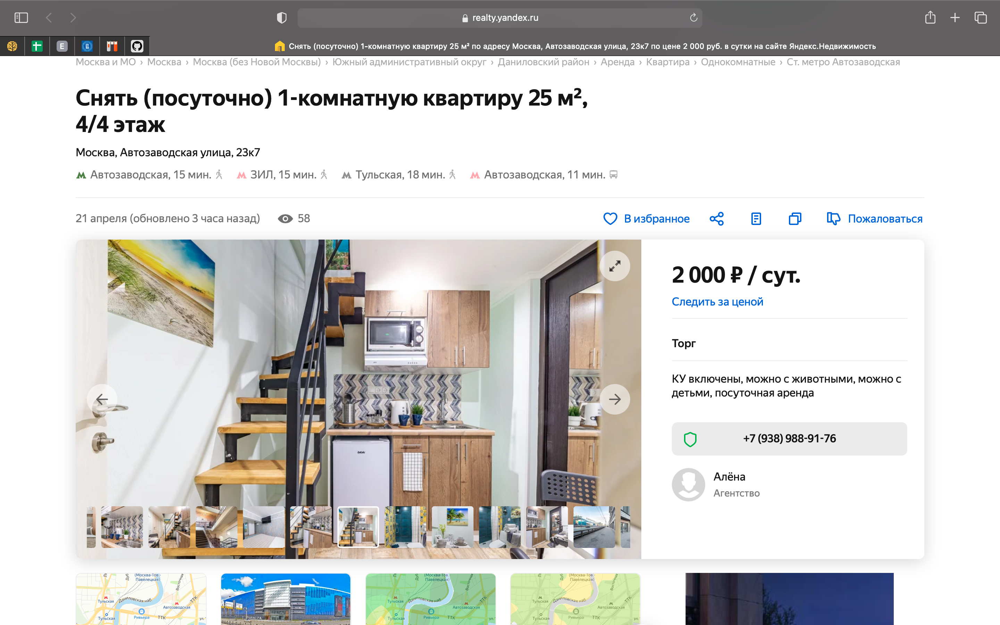

In [15]:
from IPython.display import Image
Image(filename='/Users/slavapirogov/Desktop/Снимок экрана 2021-04-27 в 19.40.14.png')

Теперь мы видим телефон и он доступен в коде страницы. Чтобы не нажимать кнопку руками, нажмем на ее с помощью библиотеки Selenium


In [16]:
from selenium import webdriver
from selenium.webdriver.chrome.options import Options

chrome_options = Options()
chrome_options.add_argument("--headless")
driver = webdriver.Chrome('/Users/slavapirogov/Downloads/chromedriver', options=chrome_options)
driver.get("https://realty.yandex.ru/offer/8340597336438397440/?isExact=YES")
if '<div class="OfferCardContacts__container--1j7yb OfferBaseInfo__contacts">' in driver.page_source:
    button_element = driver.find_element_by_xpath('/html/body/div[2]/div/div[1]/div[2]/div[1]/div[2]/div[2]/div/div[1]/div[4]')
    button_element.click()
    if '<a class="OfferCardContacts__phone--1dmlu"' in driver.page_source:
        phone = driver.find_element_by_class_name('OfferCardContacts__phone--1dmlu')
        phone = phone.text
    elif '<div class="OfferCardContacts__phones--3sCEB">' in driver.page_source:
        phone = driver.find_element_by_class_name('OfferCardContacts__phones--3sCEB')
        phone = phone.text
driver.close()
print(phone)

+7 (938) 988-91-76


Получилось!


---



Покажу пример нелучшего сайта Квартиры Посуточно.org

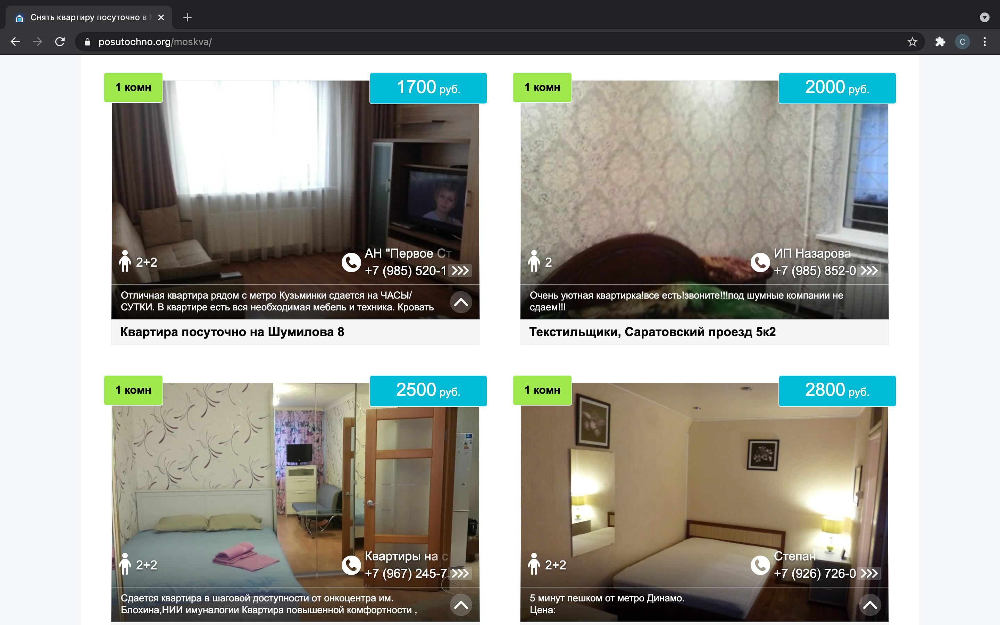

In [18]:
from IPython.display import Image
Image(filename='/Users/slavapirogov/Desktop/Снимок экрана 2021-04-27 в 19.47.51.png')

Почти вся информация на нем совершенно неоднородна и находится в разных местах.

Например, совсем непонятно как отсюда вытащить адрес, ведь он находится прямо в названии! Переходя на каждое обьявление мы увидим примерно тоже самое. Поэтому приходится искать странные зависимости, как и будет показано в следующем коде:

In [24]:
houses = []
html = urlopen("https://posutochno.org/moskva/?PAGEN_2=1")
html_soup = BeautifulSoup(html, "html.parser")
house_data = html_soup.findAll('div', class_='lcards cla')
house_data = house_data[1].findAll('div', class_='lcards__item')
houses.extend(house_data)


n = int(len(houses)) - 1
count = 0
while count <= n:
    info = houses[int(count)]
    title = info.find('div', class_='lcards__name').get_text()
    address = title.replace(" на ", " ")
    address = address.replace("сутки", "", 1)
    address = address.replace("квартира", "", 1)
    address = address.replace("посуточно", "", 1)
    address = address.replace("комната", "", 1)
    address = address.replace("студия", "", 1)
    address = address.replace("Комната", "", 1)
    address = address.replace("Студия", "", 1)
    address = address.replace("Посуточно", "", 1)
    address = address.replace("Квартира", "", 1)
    address = address.replace("Сутки", "", 1)
    address = address.replace("Посуточная", "", 1)
    address = address.replace("в Москве ", "", 1)
    address = address.replace("1к ", "", 1)
    address = address.replace("2к ", "", 1)
    address = address.replace("3к ", "", 1)
    address = address.replace("4к ", "", 1)
    address = address.replace("5к ", "", 1)
    address = address.replace("6к ", "", 1)
    print(title)
    print(address, '\n')
    count += 1

Квартира посуточно на Шумилова 8  
  Шумилова 8   

Текстильщики, Саратовский проезд 5к2  
Текстильщики, Саратовский проезд 5к2   

Квартира посуточно на Старокаширское шоссе, 4к2  
  Старокаширское шоссе, 4к2   

Квартира посуточно в Москве на Ленинградский пр-кт, 33А  
  Ленинградский пр-кт, 33А   

Посуточная квартира на Ореховый б-р, 14к1  
  Ореховый б-р, 14к1   

Квартира на сутки на ул Ленская, 28к1  
  ул Ленская, 28к1   

ул Житная, 10  
ул Житная, 10   

Квартира посуточно на ул Беговая, 26  
  ул Беговая, 26   

Квартира на сутки на ул Ленская, 28  
  ул Ленская, 28   

Посуточная квартира на ул Ивана Бабушкина, 10  
  ул Ивана Бабушкина, 10   

Ленинградское шоссе, 108к2  
Ленинградское шоссе, 108к2   

Посуточная квартира на Осенний б-р, 10к1  
  Осенний б-р, 10к1   

ул Красного Маяка4 корп 2  
ул Красного Маяка4 корп 2   

Кантемировская ул., 20К1  
Кантемировская ул., 20К1   

5-ый Монетчиковый переулок, 14  
5-ый Монетчиковый переулок, 14   

Квартира на сутки на 1-я Н

Очевидно, что такой способ не всегда будет работать, однако это явно лучше, чем ничего.

---

Возникало еще множество проблем в работе со скраперами. Тут собраны, как мне кажется, самые интересные и неочевидные.